# Project 3 - Artificial Neural Networks

In this project, you will work with a custom flower species dataset and a car object detection dataset. You will implement artificial neural networks for classification and object detection tasks with ```TensorFlow``` implementations.

The goal of this assignment include:

1. Set up datasets in format needed to run ```TensorFlow``` objects
2. Implement artificial neural networks with ```TensorFlow```
3. Carry out experiments to select best ANN hyperparameters
4. Implement best training practices with ```TensorFlow```, including checkpoints, early stopping, adaptive learning rate
5. Experiment with transfer learning using ```TensorFlow```
6. Implement qualitative and quantitative performance measures
7. Report observations, propose business-centric solutions and propose mitigating strategies

## Deliverables

As part of this project, you should deliver the following materials:

1. [**4-page IEEE-format paper**](https://www.ieee.org/conferences/publishing/templates.html). Write a paper with no more than 4 pages addressing the questions posed below. When writing this report, consider a business-oriented person as your reader (e.g. your PhD advisor, your internship manager, etc.). Tell *the story* for each datasets' goal and propose solutions by addressing (at least) the questions posed below.

2. **Python Code**. Create two separate Notebooks: (1) "training.ipynb" used for training and hyperparameter tuning, (2) "test.ipynb" for evaluating the final trained model in the test set. The "test.ipynb" should load all trained objects and simply evaluate the performance. So don't forget to **push the trained models** to your repository to allow us to run it.

All of your code should run without any errors and be well-documented. 

3. **README.md file**. Edit the readme.md file in your repository and how to use your code. If there are user-defined parameters, your readme.md file must clearly indicate so and demonstrate how to use your code. **Consider the case where the user wants to utilize your code to run on a different test set. Indicate in your readme.md file how this can be achieved.**

This is an **individual assignment**. 

These deliverables are **due Wednesday, December 7 @ 11:59pm**. Late submissions will not be accepted, so please plan accordingly.

---

# Dataset 1: Flower Species Dataset

In [1]:
#!pip install sympy
#!pip install shapely
#!pip install scikeras

In [1]:
## all imports
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('bmh')

import tensorflow as tf
from tensorflow import keras
import keras_tuner as kt


In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
# load libraries and magics
# load libraries and magics
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import joblib
from sklearn.svm import SVC
from sklearn.preprocessing import OrdinalEncoder
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import Lasso
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline 
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import LogisticRegression
from scipy.stats import expon
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve
from scipy import stats
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
import datetime
from time import time
import warnings
from sklearn.decomposition import PCA
from sklearn.manifold import MDS
from sklearn.manifold import LocallyLinearEmbedding as LLE
from scipy.spatial.distance import squareform
from scipy.spatial.distance import pdist
from sklearn.manifold import Isomap
warnings.filterwarnings('ignore')
import cv2

plt.style.use('bmh')
plt.rcParams['axes.grid'] = False

warnings.filterwarnings("ignore", category=FutureWarning)


The training dataset is saved as a ```numpy``` array and contains a total of 1678 images from 10 classes. Each RBG image is of size $300\times 300 \times 3$. The 10 classes and its label encodings are:

| Flower Species | Roses | Magnolias | Lilies | Sunflowers | Orchids | Marigold | Hibiscus | Firebush | Pentas | Bougainvillea |
| ---- -----     | ------| ----------| -------| -----------| --------| ---------| ---------| ---------| -------| --------------|
| Label          |  0    |    1      |    2   |    3       |    4    |    5     |   6      |   7      |   8    |       9       |

In [3]:
class_names = ['Roses', 'Magnolias', 'Lilies', 'Sunflowers', 'Orchids', 
               'Marigold', 'Hibiscus', 'Firebush', 'Pentas', 'Bougainvillea']

The goal is to utilize the training images to train a flower species classifier (an artificial neural network architecture), and make predictions for the test set.

Let's visualize the dataset:

In [4]:
import numpy as np
import numpy.random as npr
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('bmh')

# Loading Training Data
X_train = np.load('flower_species_classification/data_train.npy').T
t_train = np.load('flower_species_classification/labels_train.npy')

print(X_train.shape, t_train.shape)

(1658, 270000) (1658,)


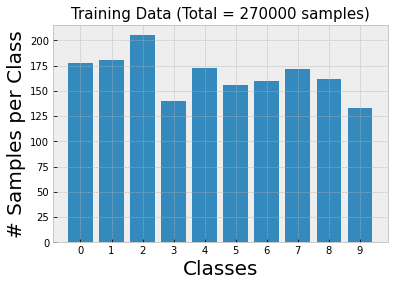

In [5]:
# Counting number samples per class
vals, counts = np.unique(t_train, return_counts=True)

plt.bar(vals, counts)
plt.xticks(range(10),range(10))
plt.xlabel('Classes',size=20)
plt.ylabel('# Samples per Class', size=20)
plt.title('Training Data (Total = '+str(X_train.shape[1])+' samples)',size=15);

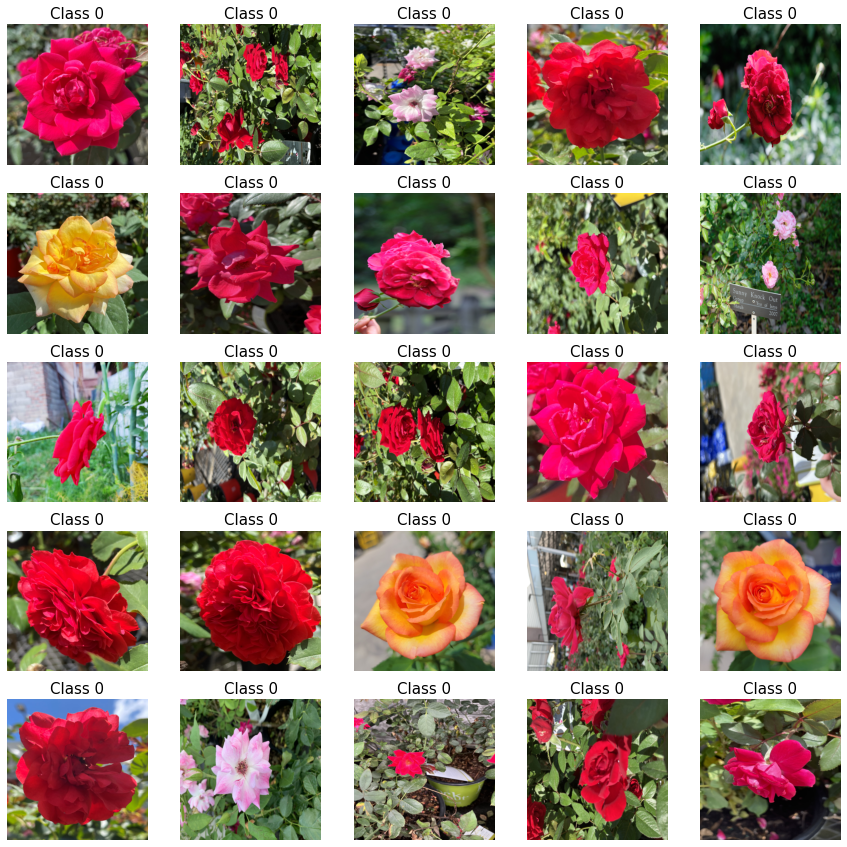

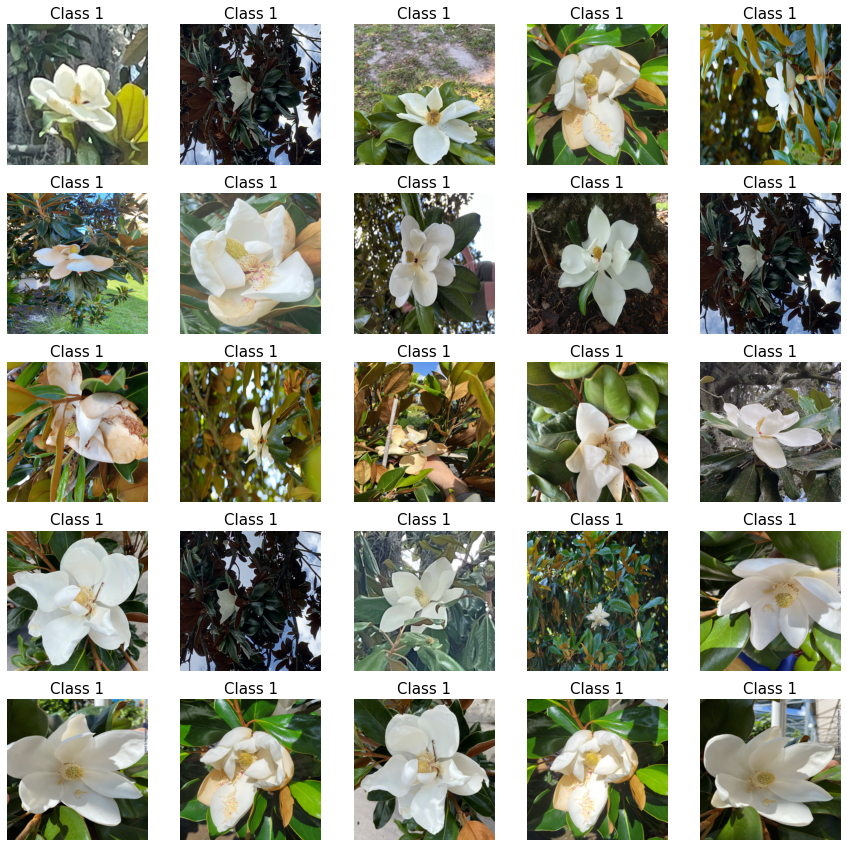

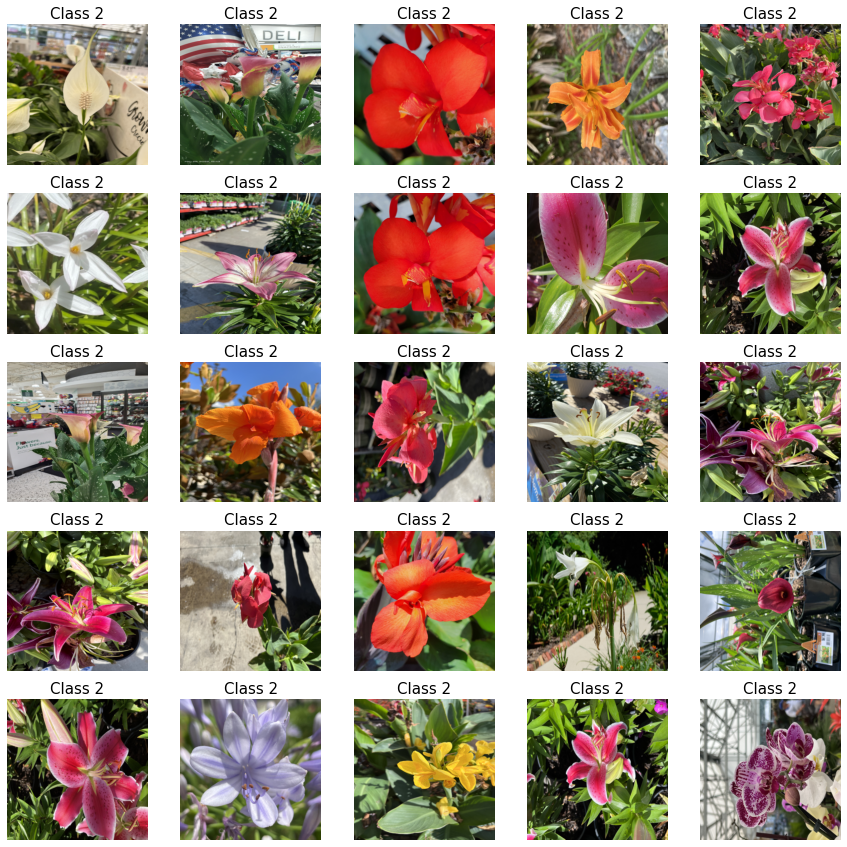

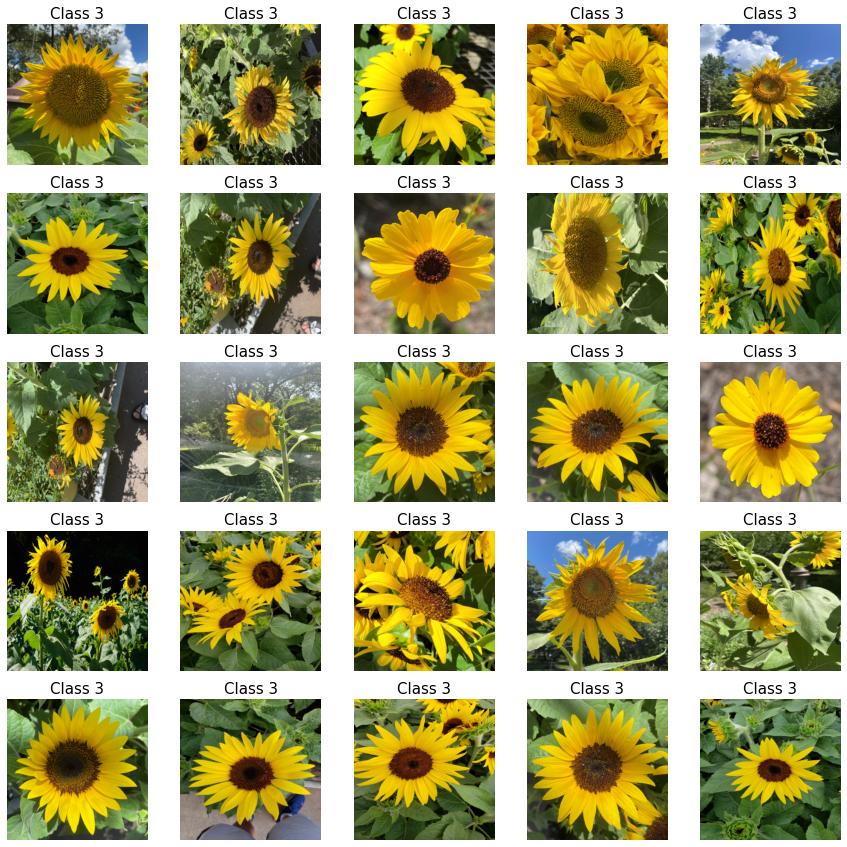

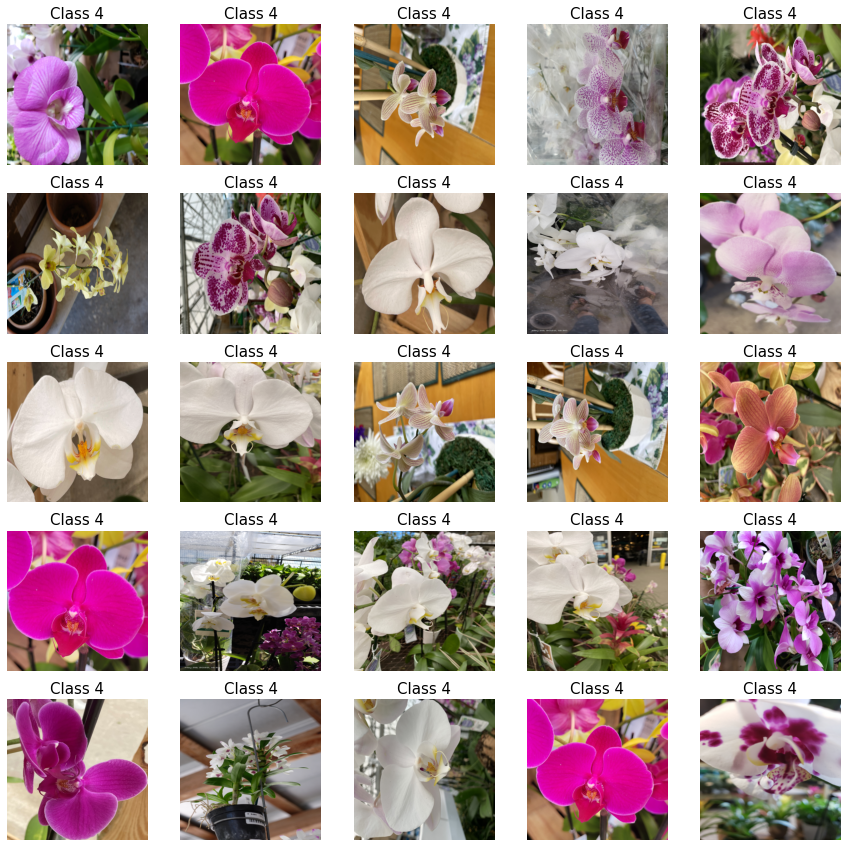

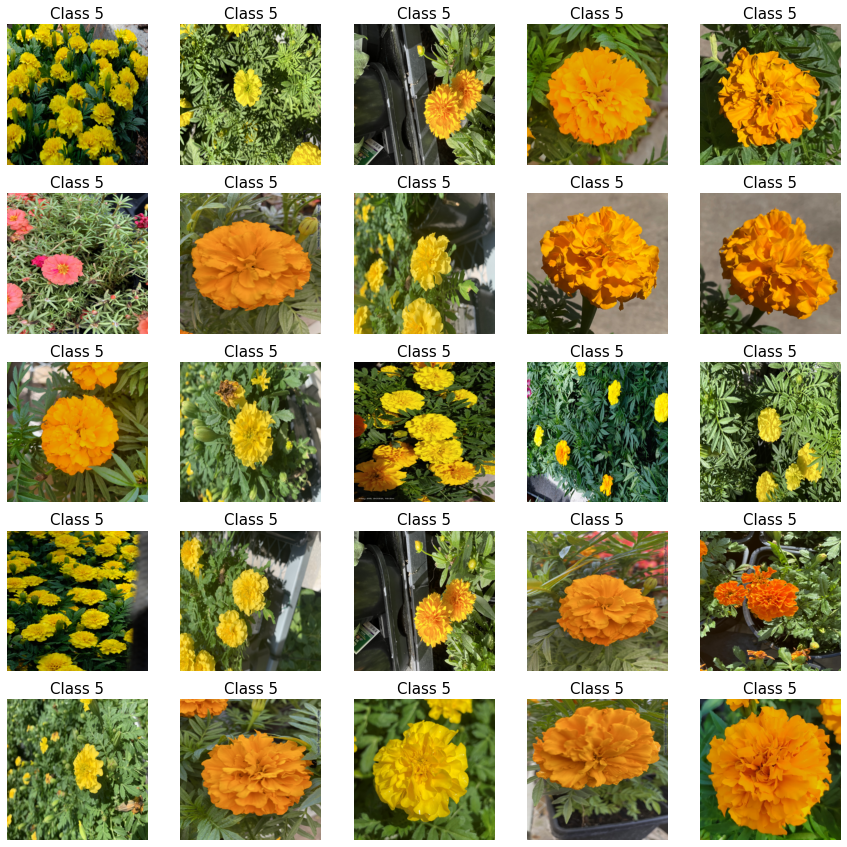

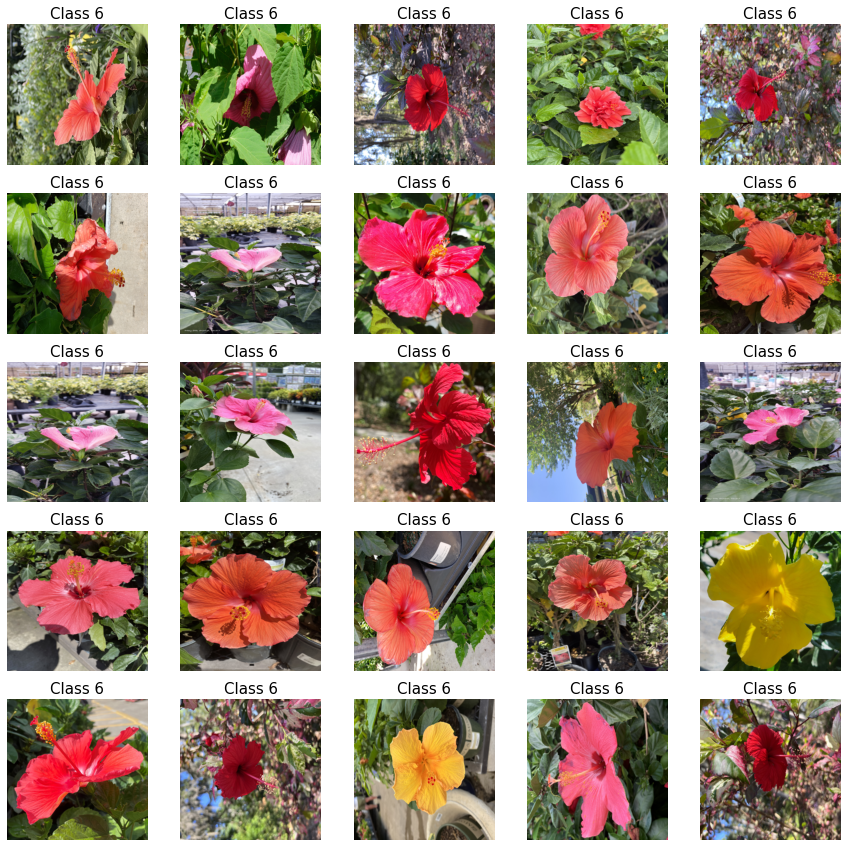

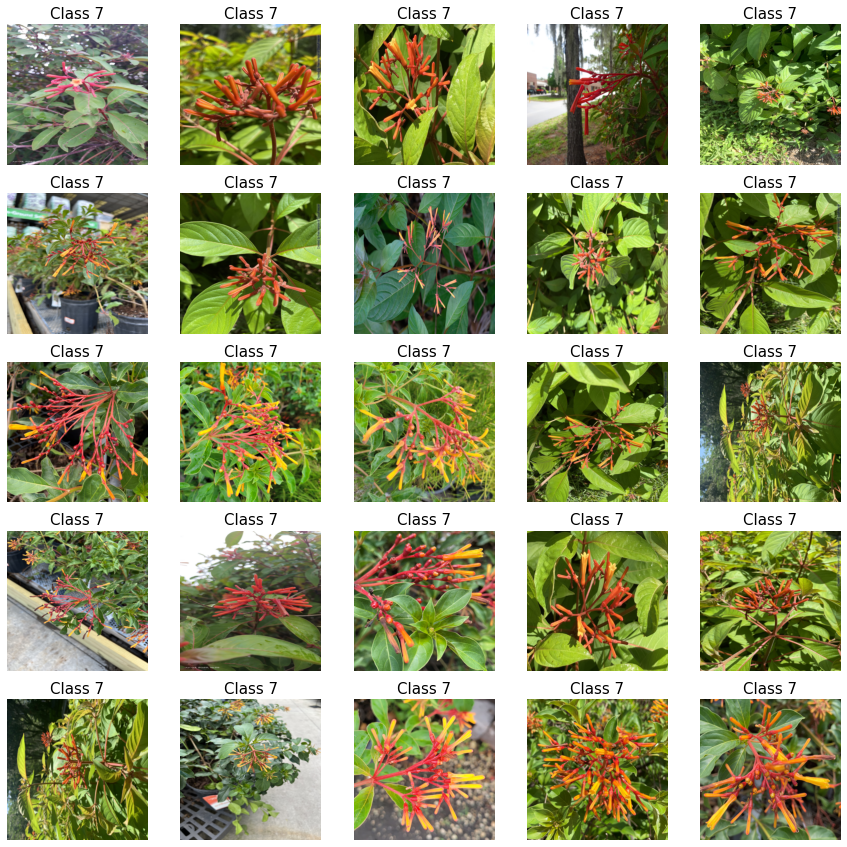

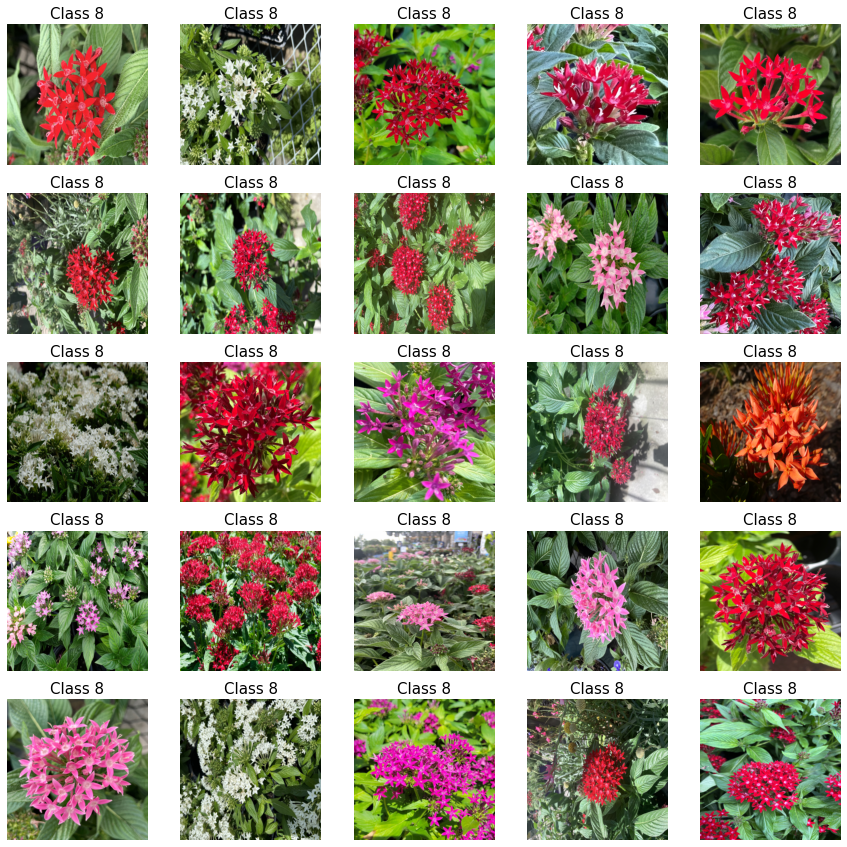

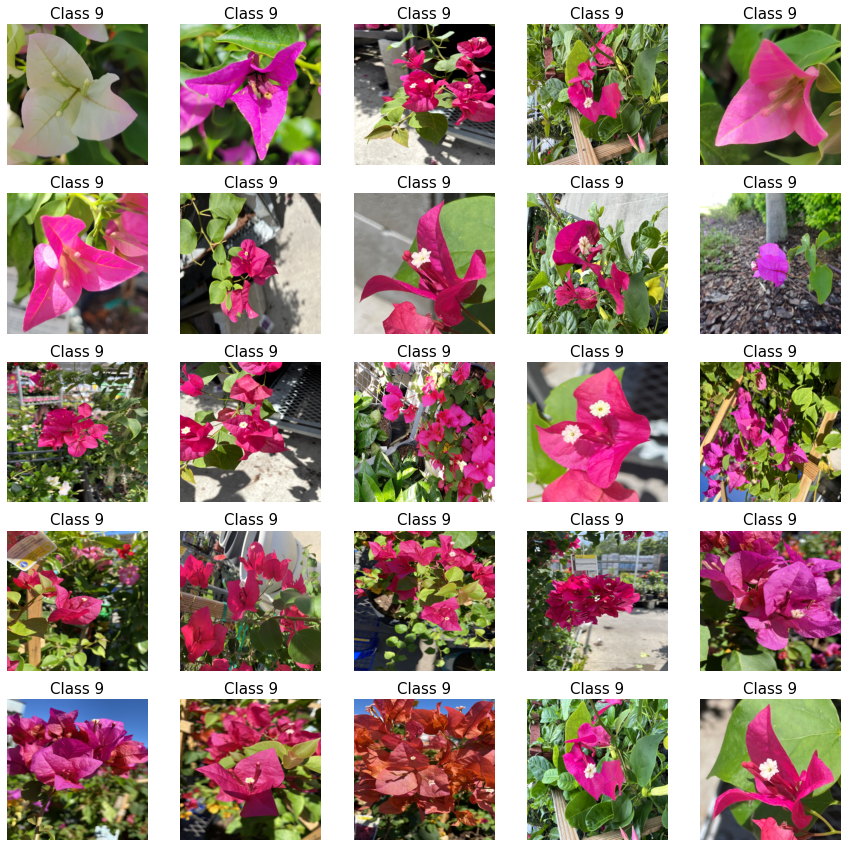

In [7]:
# Displaying some random examples per class

for i in range(0,10):
    rnd_sample = npr.permutation(np.where(t_train==i)[0])
    fig=plt.figure(figsize=(15,15))
    for j in range(25):
        fig.add_subplot(5,5,j+1)
        plt.imshow(X_train[rnd_sample[j],:].reshape((300,300,3)))
        plt.axis('off');plt.title('Class '+str(int(t_train[rnd_sample[j]])),size=15)
    plt.show()
    print('\n\n')

---

# Dataset 2: Car Detection Dataset

This dataset contains labeled annotations for 559 training samples. Each annotation corresponds to a bounding box of the object **car**. 

The goal is to train an object (car) detection artificial neural network using the training samples, and make predictions for the images in test.

Let's visualize the data:

In [6]:
from PIL import Image
import cv2 # install opencv, if you don't already have it (https://pypi.org/project/opencv-python/)
import pandas as pd

In [8]:
bbox = pd.read_csv('car_detection_dataset/train_bounding_boxes.csv')
bbox

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422
...,...,...,...,...,...
554,vid_4_9860.jpg,0.000000,198.321729,49.235251,236.223284
555,vid_4_9880.jpg,329.876184,156.482351,536.664239,250.497895
556,vid_4_9900.jpg,0.000000,168.295823,141.797524,239.176652
557,vid_4_9960.jpg,487.428988,172.233646,616.917699,228.839864


In [9]:
N = len(bbox) # no. of training samples

# Create a numpy array with all images
for i in range(N): 
    filename='car_detection_dataset/training_images/'+bbox['image'][i]
    image = np.array(Image.open(filename))
    image_col = image.ravel()[:,np.newaxis]
    
    if i==0:
        X_train = image_col
    else:
        X_train = np.hstack((X_train, image_col))

# Training feature matrices
X_train = X_train.T

# Training labels
t_train = bbox.drop('image', axis=1).round().to_numpy().astype(int)

X_train.shape, t_train.shape

((559, 770640), (559, 4))

Note that this code cell only collects data for images that contain a car within it. You may consider modifying to include all images. If no annotations is included, then assume there is no object and assign the target label [0,0,0,0].

In [10]:
# size of each RGB image
(Nx,Ny,Nz) = image.shape

Nx, Ny, Nz

(380, 676, 3)

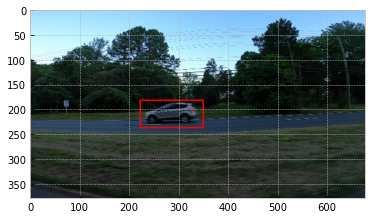

In [11]:
# Example of object visualization using opencv rectangle function
idx=N-1
x= image

plt.imshow(x)
cv2.rectangle(x, (t_train[idx,0], t_train[idx,1]), 
              (t_train[idx,2], t_train[idx,3]), 
              (255, 0, 0), 2);

plt.imshow(x)

---

# Assignment

1. Train an artificial neural network for **flower species classification** using the training set of dataset 1.

    * Experiment with several hyperparameters of the network.
    
    * You are welcome to use any architecture or approach you wish.
    
    * Report performance results in training and validation sets.
    
    * Display the learning curves.

In [13]:
# let's load the flower species data and scale the images
# We divide each pixel by 255.0 to scale the image

In [7]:
X_train_full = np.load('flower_species_classification/data_train.npy').T/255.0
t_train_full = np.load('flower_species_classification/labels_train.npy')

X_train_full.shape, t_train_full.shape


((1658, 270000), (1658,))

In [ ]:
## since the kernel is crashing I had to downsample the image to 150x150x

In [8]:
import numpy as np
import numpy.random as npr
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('bmh')

# Loading Training Data
X_train_f = np.load('flower_species_classification/data_train.npy').T/255.0
t_train_f= np.load('flower_species_classification/labels_train.npy')

#print(X_train.shape, t_train.shape)


X_train_new = []

for i in range(0,X_train_f.shape[0]):
    im1 = X_train_f[i,:].reshape(900,300)
    res = cv2.resize(im1,dsize=(225,75),interpolation = cv2.INTER_CUBIC)
    res = res.ravel()
    #X_train[i,:] = res
    #print(res)
    #print(len(res))
    X_train_new.append(res)
    #print("yes")
X_train_new = np.array(X_train_new)
X_train_new.shape

(1658, 16875)

In [16]:
## Now the next step is to split the dataset into training and testing dataset
## testing dataset will not be used anywhere in the model except to test
## We also need a validation set which helps us to train the model and back propagate errors
## hence we further need to split the training data into train and validation set

In [9]:
from sklearn.model_selection import train_test_split

# Training and Test sets
X_training, X_test, t_training, t_test = train_test_split(X_train_new, 
                                                  t_train_full, 
                                                random_state = 42,
                                                  shuffle=True,
                                                  stratify=t_train_full,
                                                  test_size=0.2)
# Train and validation sets
X_train, X_val, t_train, t_val = train_test_split(X_training, 
                                                  t_training, 
                                                  random_state = 42,
                                                  shuffle=True,
                                                  stratify=t_training,
                                                  test_size=0.2)

X_training.shape, t_training.shape, X_train.shape, t_train.shape, X_val.shape, t_val.shape

((1326, 16875), (1326,), (1060, 16875), (1060,), (266, 16875), (266,))

In [10]:
X_training.shape, t_training.shape

((1326, 16875), (1326,))

In [11]:
X_train.shape, t_train.shape

((1060, 16875), (1060,))

In [12]:
X_val.shape, t_val.shape

((266, 16875), (266,))

In [13]:
class_names = ['Roses', 'Magnolias', 'Lilies', 'Sunflowers', 'Orchids', 'Marigold', 
               'Hibiscus', 'Firebush', 'Pentas', 'Bougainvillea']

In [22]:
## reshape the train, test and val dataset to 75 X 75 X 3

In [14]:
X_train_rs = tf.constant(X_train.reshape((X_train.shape[0],75,75,3)), 
                         dtype=tf.float32)

X_train_rs.shape


2022-12-10 20:29:29.146312: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-10 20:29:29.679206: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 79111 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-80GB, pci bus id: 0000:4e:00.0, compute capability: 8.0


TensorShape([1060, 75, 75, 3])

In [15]:
X_val_rs = tf.constant(X_val.reshape((X_val.shape[0],75,75,3)), 
                       dtype=tf.float32)

X_val_rs.shape


TensorShape([266, 75, 75, 3])

In [16]:
X_test_rs = tf.constant(X_test.reshape((X_test.shape[0],75,75,3)), 
                        dtype=tf.float32)

X_test_rs.shape

TensorShape([332, 75, 75, 3])

* lets start with baseline model first and then tune the hyperparameters

### Baseline model

In [17]:
# Build baseline model with Sequential API
b_model = keras.Sequential()
b_model.add(keras.layers.Flatten(input_shape=(75,75,3)))
b_model.add(keras.layers.Dense(units=75, activation='relu', name='dense_b_1'))
b_model.add(keras.layers.Dropout(0.2))
b_model.add(keras.layers.Dense(units=50, activation='relu', name='dense_b_2'))
b_model.add(keras.layers.Dropout(0.2))
b_model.add(keras.layers.Dense(10, activation='softmax'))

In [18]:
# Set training parameters
b_model.compile(optimizer=keras.optimizers.Adam(lr=0.001),
              loss=keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [19]:
# Number of epochs
NUM_EPOCHS = 20

# Early stopping set after 5 epochs
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

# Train model
#b_model.fit(X_training_rs, t_training, epochs=NUM_EPOCHS, validation_split=0.2, callbacks=[stop_early], verbose=2)
b_model.fit(X_train_rs, t_train, epochs=20, batch_size=100,
          validation_data=(X_val_rs, t_val),
         callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/20
11/11 [==============================] - 1s 16ms/step - loss: 3.6799 - accuracy: 0.1094 - val_loss: 2.4224 - val_accuracy: 0.0865
Epoch 2/20
 1/11 [=>............................] - ETA: 0s - loss: 2.7687 - accuracy: 0.1000

2022-12-10 20:30:59.602961: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


11/11 [==============================] - 0s 6ms/step - loss: 2.3705 - accuracy: 0.1283 - val_loss: 2.2913 - val_accuracy: 0.1241
Epoch 3/20
11/11 [==============================] - 0s 6ms/step - loss: 2.2890 - accuracy: 0.1283 - val_loss: 2.2740 - val_accuracy: 0.1241
Epoch 4/20
11/11 [==============================] - 0s 5ms/step - loss: 2.2560 - accuracy: 0.1472 - val_loss: 2.2635 - val_accuracy: 0.1767
Epoch 5/20
11/11 [==============================] - 0s 6ms/step - loss: 2.2411 - accuracy: 0.1415 - val_loss: 2.2250 - val_accuracy: 0.1729
Epoch 6/20
11/11 [==============================] - 0s 6ms/step - loss: 2.1994 - accuracy: 0.1651 - val_loss: 2.1865 - val_accuracy: 0.1805
Epoch 7/20
11/11 [==============================] - 0s 6ms/step - loss: 2.1890 - accuracy: 0.1396 - val_loss: 2.1659 - val_accuracy: 0.1729
Epoch 8/20
11/11 [==============================] - 0s 5ms/step - loss: 2.1367 - accuracy: 0.1642 - val_loss: 2.1415 - val_accuracy: 0.1805
Epoch 9/20
11/11 [=============

In [20]:
b_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 16875)             0         
                                                                 
 dense_b_1 (Dense)           (None, 75)                1265700   
                                                                 
 dropout (Dropout)           (None, 75)                0         
                                                                 
 dense_b_2 (Dense)           (None, 50)                3800      
                                                                 
 dropout_1 (Dropout)         (None, 50)                0         
                                                                 
 dense (Dense)               (None, 10)                510       
                                                                 
Total params: 1,270,010
Trainable params: 1,270,010
Non-

In [21]:
def evaluate_model(model, X_test, y_test):
    """
    evaluate model on test set and show results in dataframe.
    
    Parameters
    ----------
    model : keras model
        trained keras model.
    X_test : numpy array
        Features of holdout set.
    y_test : numpy array
        Labels of holdout set.
        
    Returns
    -------
    display_df : DataFrame
        Pandas dataframe containing evaluation results.
    """
    eval_dict = model.evaluate(X_test, y_test, return_dict=True)
    
    display_df = pd.DataFrame([eval_dict.values()], columns=[list(eval_dict.keys())])
    
    return display_df



In [31]:
## evaluate results on baseline model

In [22]:
results_train = evaluate_model(b_model, X_train_rs, t_train)

# Set index to 'Baseline'
results_train.index = ['Baseline']

# Display results
results_train.head()

34/34 [==============================] - 0s 2ms/step - loss: 1.9290 - accuracy: 0.2623


,loss,accuracy
Baseline,1.928965,0.262264


In [23]:
results_val = evaluate_model(b_model, X_val_rs, t_val)

# Set index to 'Baseline'
results_val.index = ['Baseline']

# Display results
results_val.head()

9/9 [==============================] - 0s 2ms/step - loss: 2.0417 - accuracy: 0.2256


,loss,accuracy
Baseline,2.041728,0.225564


In [34]:
## With this, we can now build TensorFlow models on this data:

In [24]:
def build_model(hp):
    """
    Builds model and sets up hyperparameter space to search.
    
    Parameters
    ----------
    hp : HyperParameter object
        Configures hyperparameters to tune.
        
    Returns
    -------
    model : keras model
        Compiled model with hyperparameters to tune.
    """
    # Initialize sequential API and start building model.
    model = keras.Sequential()
    model.add(keras.layers.Flatten(input_shape=(75,75,3)))
    
    # Tune the number of hidden layers and units in each.
    # Number of hidden layers: 1 - 5
    # Number of Units: 32 - 512 with stepsize of 32
    for i in range(1, hp.Int("num_layers", 2, 6)):
        model.add(
            keras.layers.Dense(
                units=hp.Int("units_" + str(i), min_value=32, max_value=256, step=32),
                activation="relu")
            )
        
        # Tune dropout layer with values from 0 - 0.3 with stepsize of 0.1.
        model.add(keras.layers.Dropout(hp.Float("dropout_" + str(i), 0, 0.3, step=0.1)))
    
    # Add output layer.
    model.add(keras.layers.Dense(units=10, activation="softmax"))
    
    # Tune learning rate for Adam optimizer with values from 0.01, 0.001, or 0.0001
    hp_learning_rate = hp.Choice("learning_rate", values=[1e-2, 1e-3, 1e-4])
    
    # Define optimizer, loss, and metrics
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
                  loss=keras.losses.SparseCategoricalCrossentropy(),
                  metrics=["accuracy"])
    
    return model

In [25]:
tuner = kt.Hyperband(build_model,
                     objective="val_accuracy",
                     max_epochs=20,
                     factor=3,
                     hyperband_iterations=10,
                     directory="kt_dir",
                     overwrite = True,
                     project_name="kt_hyperband",)

In [26]:
# Display search space summary
tuner.search_space_summary()

Search space summary
Default search space size: 4
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 6, 'step': 1, 'sampling': None}
units_1 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 256, 'step': 32, 'sampling': None}
dropout_1 (Float)
{'default': 0.0, 'conditions': [], 'min_value': 0.0, 'max_value': 0.3, 'step': 0.1, 'sampling': None}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}


In [27]:
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

tuner.search(X_train_rs, t_train, epochs=20,  validation_data=(X_val_rs, t_val), callbacks=[stop_early], verbose=2)


Trial 300 Complete [00h 00m 02s]
val_accuracy: 0.12406015396118164

Best val_accuracy So Far: 0.35338345170021057
Total elapsed time: 00h 06m 42s
INFO:tensorflow:Oracle triggered exit


In [28]:
# Get the optimal hyperparameters from the results
best_hps=tuner.get_best_hyperparameters()[0]

# Build model
h_model = tuner.hypermodel.build(best_hps)

# Train the hypertuned model
#h_model.fit(X_training_rs, t_training, epochs=20, validation_split=0.2, callbacks=[stop_early], verbose=2)
h_model.fit(X_train_rs, t_train, epochs=20, batch_size=100,
          validation_data=(X_val_rs, t_val),
         callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/20
11/11 [==============================] - 0s 13ms/step - loss: 2.3475 - accuracy: 0.1491 - val_loss: 2.1575 - val_accuracy: 0.1692
Epoch 2/20
11/11 [==============================] - 0s 5ms/step - loss: 2.1231 - accuracy: 0.2208 - val_loss: 2.1360 - val_accuracy: 0.1880
Epoch 3/20
11/11 [==============================] - 0s 5ms/step - loss: 1.9730 - accuracy: 0.2613 - val_loss: 2.0497 - val_accuracy: 0.2519
Epoch 4/20
11/11 [==============================] - 0s 5ms/step - loss: 1.9262 - accuracy: 0.3226 - val_loss: 2.0039 - val_accuracy: 0.2368
Epoch 5/20
11/11 [==============================] - 0s 6ms/step - loss: 1.8257 - accuracy: 0.3585 - val_loss: 1.9618 - val_accuracy: 0.2820
Epoch 6/20
11/11 [==============================] - 0s 6ms/step - loss: 1.7769 - accuracy: 0.3717 - val_loss: 1.9246 - val_accuracy: 0.3195
Epoch 7/20
11/11 [==============================] - 0s 5ms/step - loss: 1.7089 - accuracy: 0.3943 - val_loss: 1.9441 - val_accuracy: 0.2744
Epoch 8/20
11/11 [=

In [29]:
hyper_df_train = evaluate_model(h_model, X_train_rs, t_train)

# Set index to hypertuned
hyper_df_train.index = ["Hypertuned"]

# Append results in dataframe
results_train.append(hyper_df_train)

34/34 [==============================] - 0s 1ms/step - loss: 1.2209 - accuracy: 0.6604


,loss,accuracy
Baseline,1.928965,0.262264
Hypertuned,1.220921,0.660377


In [30]:
hyper_df_val = evaluate_model(h_model, X_val_rs, t_val)

# Set index to hypertuned
hyper_df_val.index = ["Hypertuned"]

# Append results in dataframe
results_val.append(hyper_df_val)

9/9 [==============================] - 0s 2ms/step - loss: 1.8275 - accuracy: 0.3045


,loss,accuracy
Baseline,2.041728,0.225564
Hypertuned,1.827507,0.304511


* Transfer learning consists of taking features learned on one problem, and leveraging them on a new, similar problem. For instance, features from a model that has learned to identify airplanes may be useful to kick-start a model meant to identify birds.

* Transfer learning is usually done for tasks where your dataset has too little data to train a full-scale model from scratch.

* The most common workflow for implementation transfer learning is as follows:

* Take layers from a previously trained model.
* Freeze them, so as to avoid destroying any of the information they contain during future training rounds. You can do this in the base model by setting trainable = False.
* Add some new, trainable layers on top of the frozen layers. They will learn to turn the old features into predictions on a new dataset.
* Train the new layers on your dataset.
* A last, optional step, is fine-tuning, which consists of unfreezing the entire model you obtained above (or part of it), and re-training it on the new data with a very low learning rate. This can potentially achieve meaningful improvements, by incrementally adapting the pretrained features to the new data.

* First, instantiate a base model with pre-trained weights.

In [31]:
base_model = keras.applications.Xception(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(75, 75, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.


In [43]:
## Then, freeze the base model.

In [32]:
base_model.trainable = False

#freezes all the layers except the output


In [33]:
IMG_SIZE = 75

inputs = keras.Input(shape=(75, 75, 3))
# Input layer

inputs_resized = keras.layers.Resizing(IMG_SIZE, IMG_SIZE)(inputs) # 150-150-3
# resizing input to match pretrained model

x = base_model(inputs_resized, training=False)
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.

In [34]:
inputs.shape, inputs_resized.shape, x.shape

(TensorShape([None, 75, 75, 3]),
 TensorShape([None, 75, 75, 3]),
 TensorShape([None, 3, 3, 2048]))

In [35]:
# Option 1: Pooling

# Convert features of shape `base_model.output_shape[1:]` to vectors
x_pooling = keras.layers.GlobalAveragePooling2D()(x)

x_pooling.shape

TensorShape([None, 2048])

In [36]:
# Option 2: Flattening

# Convert features of shape `base_model.output_shape[1:]` to vectors
x_flatten = keras.layers.Flatten()(x)

x_flatten.shape


TensorShape([None, 18432])

In [37]:
# A Dense classifier with 10 units and softmax activation function
outputs = keras.layers.Dense(10, activation='softmax')(x_pooling)

# Assembling model
t_model = keras.Model(inputs, outputs)


In [38]:
inputs.shape, inputs_resized.shape, x.shape, outputs.shape


(TensorShape([None, 75, 75, 3]),
 TensorShape([None, 75, 75, 3]),
 TensorShape([None, 3, 3, 2048]),
 TensorShape([None, 10]))

In [61]:
## Train the model on new data.

In [39]:
t_model.compile(optimizer=keras.optimizers.Nadam(),
              loss=keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

t_model.fit(X_train_rs,t_train, epochs=20, batch_size=2,
          validation_data=(X_val_rs, t_val),
          callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/20


2022-12-10 20:42:19.507442: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8201
2022-12-10 20:42:20.729158: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Running ptxas --version returned 32512
2022-12-10 20:42:20.931811: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: ptxas exited with non-zero error code 32512, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


530/530 [==============================] - 7s 7ms/step - loss: 2.1446 - accuracy: 0.2358 - val_loss: 2.1911 - val_accuracy: 0.2481
Epoch 2/20
530/530 [==============================] - 3s 6ms/step - loss: 1.8416 - accuracy: 0.3830 - val_loss: 2.0946 - val_accuracy: 0.2444
Epoch 3/20
530/530 [==============================] - 3s 6ms/step - loss: 1.6805 - accuracy: 0.4623 - val_loss: 2.0814 - val_accuracy: 0.2744
Epoch 4/20
530/530 [==============================] - 3s 6ms/step - loss: 1.5643 - accuracy: 0.5160 - val_loss: 2.0965 - val_accuracy: 0.2820
Epoch 5/20
530/530 [==============================] - 3s 6ms/step - loss: 1.4646 - accuracy: 0.5538 - val_loss: 2.0864 - val_accuracy: 0.2932
Epoch 6/20
530/530 [==============================] - 3s 6ms/step - loss: 1.3939 - accuracy: 0.5887 - val_loss: 2.2080 - val_accuracy: 0.3083
Epoch 7/20
530/530 [==============================] - 3s 6ms/step - loss: 1.3263 - accuracy: 0.6104 - val_loss: 2.0647 - val_accuracy: 0.2932
Epoch 8/20
530/53

In [40]:
t_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 75, 75, 3)]       0         
                                                                 
 resizing (Resizing)         (None, 75, 75, 3)         0         
                                                                 
 xception (Functional)       (None, 3, 3, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_2 (Dense)             (None, 10)                20490     
                                                                 
Total params: 20,881,970
Trainable params: 20,490
Non-trainable params: 20,861,480
____________________________________________

In [41]:
y_train = np.argmax(t_model.predict(X_train_rs),axis=1)

y_train.shape

(1060,)

In [ ]:
## metrics for training set

In [42]:
from sklearn.metrics import classification_report

print(classification_report(t_train, y_train, target_names=class_names))

               precision    recall  f1-score   support

        Roses       0.55      0.77      0.64       113
    Magnolias       0.95      0.76      0.84       115
       Lilies       0.76      0.76      0.76       131
   Sunflowers       0.96      0.74      0.84        90
      Orchids       0.92      0.89      0.90       110
     Marigold       0.88      0.73      0.80       100
     Hibiscus       0.85      0.62      0.72       102
     Firebush       0.78      0.65      0.71       110
       Pentas       0.48      0.89      0.62       104
Bougainvillea       0.90      0.62      0.74        85

     accuracy                           0.75      1060
    macro avg       0.80      0.74      0.76      1060
 weighted avg       0.80      0.75      0.76      1060



In [43]:
y_val = np.argmax(t_model.predict(X_val_rs),axis=1)

y_val.shape

(266,)

In [44]:
print(classification_report(t_val, y_val, target_names=class_names))

               precision    recall  f1-score   support

        Roses       0.24      0.32      0.27        28
    Magnolias       0.50      0.31      0.38        29
       Lilies       0.28      0.39      0.33        33
   Sunflowers       0.33      0.18      0.24        22
      Orchids       0.43      0.54      0.48        28
     Marigold       0.39      0.44      0.42        25
     Hibiscus       0.25      0.15      0.19        26
     Firebush       0.44      0.25      0.32        28
       Pentas       0.25      0.46      0.32        26
Bougainvillea       0.33      0.14      0.20        21

     accuracy                           0.33       266
    macro avg       0.34      0.32      0.31       266
 weighted avg       0.35      0.33      0.32       266



### Learning curves

In [ ]:
## learning curve for base model

In [45]:
history_base = b_model.fit(X_train_rs, t_train, epochs=20, batch_size=100,
          validation_data=(X_val_rs, t_val),
         callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/20
11/11 [==============================] - 0s 10ms/step - loss: 2.0098 - accuracy: 0.1962 - val_loss: 2.0356 - val_accuracy: 0.2406
Epoch 2/20
11/11 [==============================] - 0s 6ms/step - loss: 2.0094 - accuracy: 0.1925 - val_loss: 2.0142 - val_accuracy: 0.2105
Epoch 3/20
11/11 [==============================] - 0s 6ms/step - loss: 1.9817 - accuracy: 0.1887 - val_loss: 2.0194 - val_accuracy: 0.2331
Epoch 4/20
11/11 [==============================] - 0s 6ms/step - loss: 1.9975 - accuracy: 0.1925 - val_loss: 2.1021 - val_accuracy: 0.1955
Epoch 5/20
11/11 [==============================] - 0s 6ms/step - loss: 2.0209 - accuracy: 0.2019 - val_loss: 2.0463 - val_accuracy: 0.2068
Epoch 6/20
11/11 [==============================] - 0s 6ms/step - loss: 1.9899 - accuracy: 0.2047 - val_loss: 2.0492 - val_accuracy: 0.2180
Epoch 7/20
11/11 [==============================] - 0s 6ms/step - loss: 1.9937 - accuracy: 0.2217 - val_loss: 2.1214 - val_accuracy: 0.1992


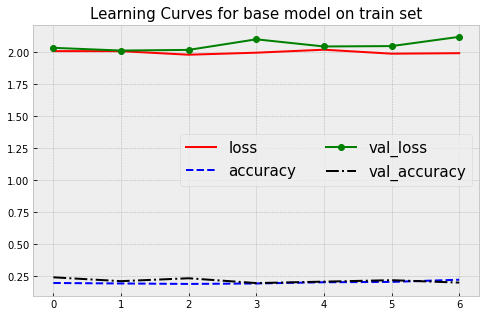

In [46]:
key_names = list(history_base.history.keys())
colors = ['-r','--b','-og','-.k']

plt.figure(figsize=(8,5))
for i in range(len(key_names)):
    plt.plot(history_base.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15,ncol=2)
plt.title('Learning Curves for base model on train set', size=15);
plt.savefig('lc_baseline_prob_1.png',dpi=900)

In [47]:
history_hyper = h_model.fit(X_train_rs, t_train, epochs=20, batch_size=100,
          validation_data=(X_val_rs, t_val),
         callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/20
11/11 [==============================] - 0s 7ms/step - loss: 1.2756 - accuracy: 0.6151 - val_loss: 1.8700 - val_accuracy: 0.3346
Epoch 2/20
11/11 [==============================] - 0s 6ms/step - loss: 1.2578 - accuracy: 0.6217 - val_loss: 1.8831 - val_accuracy: 0.3271
Epoch 3/20
11/11 [==============================] - 0s 6ms/step - loss: 1.2224 - accuracy: 0.6462 - val_loss: 1.8751 - val_accuracy: 0.3496
Epoch 4/20
11/11 [==============================] - 0s 6ms/step - loss: 1.2064 - accuracy: 0.6443 - val_loss: 1.8165 - val_accuracy: 0.3534
Epoch 5/20
11/11 [==============================] - 0s 6ms/step - loss: 1.1485 - accuracy: 0.6736 - val_loss: 1.8267 - val_accuracy: 0.3759
Epoch 6/20
11/11 [==============================] - 0s 6ms/step - loss: 1.1385 - accuracy: 0.6887 - val_loss: 1.8578 - val_accuracy: 0.3271
Epoch 7/20
11/11 [==============================] - 0s 6ms/step - loss: 1.1433 - accuracy: 0.6736 - val_loss: 1.8547 - val_accuracy: 0.3459
Epoch 8/20
11/11 [==

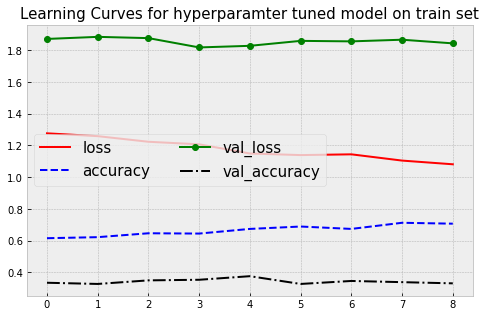

In [48]:
key_names = list(history_hyper.history.keys())
colors = ['-r','--b','-og','-.k']

plt.figure(figsize=(8,5))
for i in range(len(key_names)):
    plt.plot(history_hyper.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15,ncol=2)
plt.title('Learning Curves for hyperparamter tuned model on train set', size=15);
plt.savefig('lc_hyp_prob_1.png',dpi=900)

In [50]:
history_t = t_model.fit(X_train_rs, t_train, epochs=20, batch_size=2,
          validation_data=(X_val_rs, t_val),
         callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/20
530/530 [==============================] - 3s 6ms/step - loss: 1.0102 - accuracy: 0.7453 - val_loss: 2.2610 - val_accuracy: 0.3271
Epoch 2/20
530/530 [==============================] - 3s 6ms/step - loss: 0.9733 - accuracy: 0.7594 - val_loss: 2.1825 - val_accuracy: 0.3346
Epoch 3/20
530/530 [==============================] - 3s 6ms/step - loss: 0.9367 - accuracy: 0.7679 - val_loss: 2.2673 - val_accuracy: 0.3271
Epoch 4/20
530/530 [==============================] - 3s 6ms/step - loss: 0.9018 - accuracy: 0.7821 - val_loss: 2.2720 - val_accuracy: 0.3308
Epoch 5/20
530/530 [==============================] - 3s 6ms/step - loss: 0.8783 - accuracy: 0.7811 - val_loss: 2.3334 - val_accuracy: 0.3158
Epoch 6/20
530/530 [==============================] - 3s 6ms/step - loss: 0.8417 - accuracy: 0.7991 - val_loss: 2.3463 - val_accuracy: 0.3195
Epoch 7/20
530/530 [==============================] - 3s 6ms/step - loss: 0.8102 - accuracy: 0.8057 - val_loss: 2.3804 - val_accuracy: 0.3083


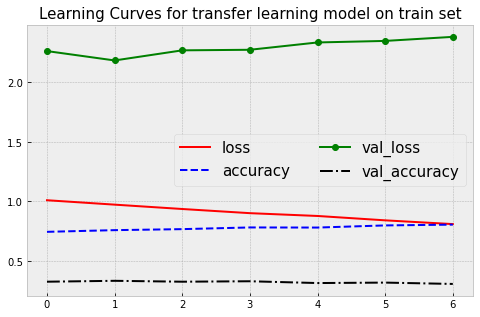

In [51]:
key_names = list(history_t.history.keys())
colors = ['-r','--b','-og','-.k']

plt.figure(figsize=(8,5))
for i in range(len(key_names)):
    plt.plot(history_t.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15,ncol=2)
plt.title('Learning Curves for transfer learning model on train set', size=15);
plt.savefig('lc_transfer_prob_1.png',dpi=900)

In [ ]:
### store all the models
### store the test dataset as well

In [52]:
b_model.save('model_b_1')
h_model.save('model_h_1')
t_model.save('model_t_1')

2022-12-10 20:45:02.480339: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: model_b_1/assets
INFO:tensorflow:Assets written to: model_h_1/assets
INFO:tensorflow:Assets written to: model_t_1/assets


In [53]:
## store the datasets
import pickle
joblib.dump(X_test_rs,"X_test_rs.pkl")
joblib.dump(t_test,"t_test.pkl")


['t_test.pkl']

In [ ]:
'''
import pickle
joblib.dump(b_model,"b_model_1.pkl")
joblib.dump(h_model,"h_model_1.pkl")
joblib.dump(t_model,"t_model_1.pkl")
'''

---

#### Question 2 is required for completion for the EEL 5934 section only. Individuals in EEL 4930 are welcome to solve these tasks but no extra credit will be credited.

2. Discuss how you would validate performance in the test set given that no target labels are provided. Discuss also how you would address the case where no car is present in the image. For the latter, it may be useful consider all training images and add a fix target label (e.g. [0,0,0,0]) for all images without a car within it.

    * Consider the case where the exact bounding box location is not particularly the target. There an acceptable margin an error. Perhaps describe your approach in the context of overlapping Region of Interest (ROI).
    
    * You may use [MakeSenseAI](https://www.makesense.ai/) to create your own test labels (a small subset of test samples suffices) to demonstrate your validation metric.

In [3]:
# import Point, Polygon
from sympy import Point, Polygon

# creating points using Point()
# the four coordinates of rectangle given xmin,ymin and xmax, ymax
# To find union and intersection of two polygons we need to map it to coordinate points
# Hence using xmin,ymin,xmax,ymax we will find the four coordinates
# The four coordinates will be
# Xmin,Ymin
# Xmax,Ymin
# Xmax,Ymax
# Xmin,Ymax

def find_intersect_union_ratio(i,y_pred,t_train):
    Xmin1 = y_pred[i][0]
    Ymin1 = y_pred[i][1]
    Xmax1 = y_pred[i][2]
    Ymax1 = y_pred[i][3]

    Xmin2 = t_train[i][0]
    Ymin2 = t_train[i][1]
    Xmax2 = t_train[i][2]
    Ymax2 = t_train[i][3]

    from shapely.geometry import Polygon
    polygon = Polygon([(Xmin1, Ymin1), (Xmin1, Ymax1), (Xmax1, Ymax1), (Xmax1, Ymin1)])
    other_polygon = Polygon([(Xmin2, Ymin2), (Xmin2, Ymax2), (Xmax2, Ymax2), (Xmax2, Ymin2)])
    
    # creating polygons using Polygon()
    
    intersect_area = polygon.intersection(other_polygon).area
    union_area = polygon.union(other_polygon).area
    
    # find the ratio of intersection over union
    #print("intersection")
    #print(intersect_area)
    #print("union")
    #print(union_area)
    
    ratio_metric = intersect_area/union_area
    
    return ratio_metric

## this will return two new polygons
## intersect_area will encapsulate the points which form the intersection
## union_area will encapsulate the points which form the union


In [4]:
## find score of all interection over union for each image

def find_total_ratio(y_pred,t_train):
    n = len(y_pred)
    ans = 0
    for i in range(len(y_pred)):
        ans += find_intersect_union_ratio(i,y_pred,t_train)
    
    avg = ans/n
    return avg

---

3. Train an artificial neural network for **object detection** using the training set of dataset 2.

    * Experiment with several hyperparameters of the network.
    
    * You are welcome to use any architecture or approach you wish.
    
    * Report performance results in training and validation sets.
    
    * Display the learning curves.

In [5]:
from PIL import Image
import cv2 # install opencv, if you don't already have it (https://pypi.org/project/opencv-python/)
import pandas as pd

In [6]:
bbox = pd.read_csv('car_detection_dataset/train_bounding_boxes.csv')
bbox

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422
...,...,...,...,...,...
554,vid_4_9860.jpg,0.000000,198.321729,49.235251,236.223284
555,vid_4_9880.jpg,329.876184,156.482351,536.664239,250.497895
556,vid_4_9900.jpg,0.000000,168.295823,141.797524,239.176652
557,vid_4_9960.jpg,487.428988,172.233646,616.917699,228.839864


In [7]:
N = len(bbox) # no. of training samples

# Create a numpy array with all images
for i in range(N): 
    filename='car_detection_dataset/training_images/'+bbox['image'][i]
    image = np.array(Image.open(filename))
    image_col = image.ravel()[:,np.newaxis]
    
    if i==0:
        X_train = image_col
    else:
        X_train = np.hstack((X_train, image_col))

# Training feature matrices
X_train = X_train.T

# Training labels
t_train = bbox.drop('image', axis=1).round().to_numpy().astype(int)

X_train.shape, t_train.shape

((559, 770640), (559, 4))

In [8]:
X_train_rs = tf.constant(X_train.reshape((X_train.shape[0],380,676,3)), 
                         dtype=tf.float32)

X_train_rs.shape

2022-12-10 20:52:14.428884: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-10 20:52:14.958685: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 79111 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-80GB, pci bus id: 0000:4e:00.0, compute capability: 8.0


TensorShape([559, 380, 676, 3])

In [9]:
# size of each RGB image
(Nx,Ny,Nz) = image.shape

Nx, Ny, Nz

(380, 676, 3)

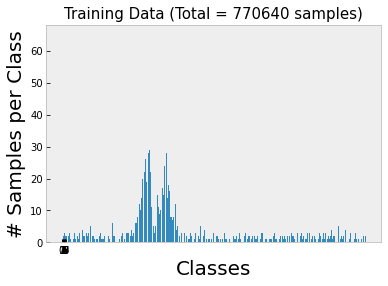

In [10]:
# Counting number samples per class
vals, counts = np.unique(t_train, return_counts=True)

plt.bar(vals, counts)
plt.xticks(range(10),range(10))
plt.xlabel('Classes',size=20)
plt.ylabel('# Samples per Class', size=20)
plt.title('Training Data (Total = '+str(X_train.shape[1])+' samples)',size=15);

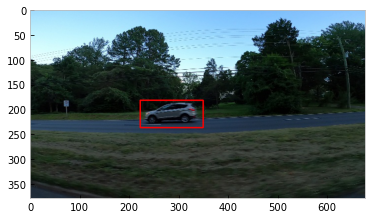

In [10]:
# Example of object visualization using opencv rectangle function
idx=N-1
x= image

plt.imshow(x)
cv2.rectangle(x, (t_train[idx,0], t_train[idx,1]), 
              (t_train[idx,2], t_train[idx,3]), 
              (255, 0, 0), 2);
plt.imshow(x)
plt.savefig('train_bounding_box.png',dpi=900)

In [11]:
from sklearn.model_selection import train_test_split

# Train and validation sets
X_training, X_val, t_training, t_val = train_test_split(X_train, 
                                                  t_train, 
                                                    random_state = 42,
                                                  shuffle=True,
                                                  test_size=0.2)

X_training.shape, t_training.shape, X_train.shape, t_train.shape, X_val.shape, t_val.shape

((447, 770640), (447, 4), (559, 770640), (559, 4), (112, 770640), (112, 4))

In [12]:
## reshape the training data input

X_training_rs = tf.constant(X_training.reshape((X_training.shape[0],380,676,3)), 
                         dtype=tf.float32)

X_training_rs.shape


TensorShape([447, 380, 676, 3])

In [13]:
## reshape the validation data input

X_val_rs = tf.constant(X_val.reshape((X_val.shape[0],380,676,3)), 
                         dtype=tf.float32)

X_val_rs.shape


TensorShape([112, 380, 676, 3])

In [14]:
X_train_rs = tf.constant(X_train.reshape((X_train.shape[0],380,676,3)), 
                         dtype=tf.float32)

X_train_rs.shape


TensorShape([559, 380, 676, 3])

In [15]:
def evaluate_model(model, X_test, y_test):
    """
    evaluate model on test set and show results in dataframe.
    
    Parameters
    ----------
    model : keras model
        trained keras model.
    X_test : numpy array
        Features of holdout set.
    y_test : numpy array
        Labels of holdout set.
        
    Returns
    -------
    display_df : DataFrame
        Pandas dataframe containing evaluation results.
    """
    eval_dict = model.evaluate(X_test, y_test, return_dict=True)
    
    display_df = pd.DataFrame([eval_dict.values()], columns=[list(eval_dict.keys())])
    
    return display_df



In [16]:
def build_model(hp):
    """
    Builds model and sets up hyperparameter space to search.
    
    Parameters
    ----------
    hp : HyperParameter object
        Configures hyperparameters to tune.
        
    Returns
    -------
    model : keras model
        Compiled model with hyperparameters to tune.
    """
    # Initialize sequential API and start building model.
    base_model = keras.applications.Xception(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(300, 300, 3),
    include_top=False) 
    #model.add(keras.layers.Flatten(input_shape=(300,300,3)))
    base_model.trainable = True
    IMG_SIZE = 300

    inputs = keras.Input(shape=(380, 676, 3))
    # Input layer

    inputs_resized = keras.layers.Resizing(IMG_SIZE, IMG_SIZE)(inputs) # 150-150-3
    # resizing input to match pretrained model

    x = base_model(inputs_resized, training=False)
    
    x_pooling = keras.layers.GlobalAveragePooling2D()(x)
    x_flatten = keras.layers.Flatten()(x)
    outputs = keras.layers.Dense(4, activation='linear')(x_pooling)

    # Assembling model
    t_model = keras.Model(inputs, outputs)
    
    # Tune learning rate for Adam optimizer with values from 0.01, 0.001, or 0.0001
    hp_learning_rate = hp.Choice("learning_rate", values=[1e-2, 1e-3, 1e-4])
    
   
    t_model.compile(optimizer=keras.optimizers.Nadam(learning_rate=hp_learning_rate),
              loss="mse",
              metrics=['mse'])
    
    return t_model

In [17]:
tuner = kt.Hyperband(build_model,
                     objective="mse",
                     max_epochs=20,
                     factor=3,
                     hyperband_iterations=10,
                     directory="kt_dir",
                     overwrite = True,
                     project_name="kt_hyperband",)

In [18]:
# Display search space summary
tuner.search_space_summary()

Search space summary
Default search space size: 1
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}


In [19]:
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

tuner.search(X_training_rs, t_training, epochs=20,validation_data=(X_val_rs, t_val), callbacks=[stop_early], verbose=2)


Trial 3 Complete [00h 00m 30s]
mse: 23588.958984375

Best mse So Far: 23588.958984375
Total elapsed time: 00h 01m 35s
INFO:tensorflow:Oracle triggered exit


In [20]:
# Get the optimal hyperparameters from the results
best_hps=tuner.get_best_hyperparameters()[0]
print("best hyperparameters")
print(best_hps)
# Build model
h_model = tuner.hypermodel.build(best_hps)

# Train the hypertuned model
#h_model.fit(X_training_rs, t_training, epochs=20, validation_split=0.2, callbacks=[stop_early], verbose=2)
h_model.fit(X_training_rs, t_training, epochs=20, batch_size=2,
          validation_data=(X_val_rs, t_val),
         callbacks=[keras.callbacks.EarlyStopping(patience=5)])

best hyperparameters
Epoch 1/20
224/224 [==============================] - 21s 61ms/step - loss: 26875.4258 - mse: 26875.4258 - val_loss: 22045.4180 - val_mse: 22045.4180
Epoch 2/20
224/224 [==============================] - 13s 57ms/step - loss: 23499.8633 - mse: 23499.8633 - val_loss: 19715.6719 - val_mse: 19715.6719
Epoch 3/20
224/224 [==============================] - 13s 57ms/step - loss: 22777.0586 - mse: 22777.0586 - val_loss: 20624.8633 - val_mse: 20624.8633
Epoch 4/20
224/224 [==============================] - 13s 57ms/step - loss: 16669.1816 - mse: 16669.1816 - val_loss: 21834.9316 - val_mse: 21834.9316
Epoch 5/20
224/224 [==============================] - 13s 57ms/step - loss: 14472.0615 - mse: 14472.0615 - val_loss: 24899.2715 - val_mse: 24899.2715
Epoch 6/20
224/224 [==============================] - 13s 57ms/step - loss: 13552.9121 - mse: 13552.9121 - val_loss: 25876.4336 - val_mse: 25876.4336
Epoch 7/20
224/224 [==============================] - 13s 57ms/step - loss: 142

## metrics for train set

In [21]:
hyper_df_train = evaluate_model(h_model, X_training_rs, t_training)

# Set index to hypertuned
hyper_df_train.index = ["Train set"]

# Append results in dataframe
hyper_df_train.head()


14/14 [==============================] - 1s 49ms/step - loss: 8764.4541 - mse: 8764.4541


,loss,mse
Train set,8764.454102,8764.454102


In [22]:
y_pred_2 = h_model.predict(X_training_rs)
y_pred_2.shape

(447, 4)

In [23]:
y_pred_2

array([[201.86879, 172.7992 , 303.71872, 219.05585],
       [121.44253, 170.6088 , 222.25299, 220.85408],
       [236.89458, 170.98749, 334.17752, 222.24467],
       ...,
       [280.60736, 171.38097, 388.7278 , 222.55542],
       [328.94183, 177.34108, 431.20245, 222.1876 ],
       [224.17656, 161.625  , 337.7178 , 213.49698]], dtype=float32)

In [24]:
t_training

array([[228, 186, 360, 237],
       [ 98, 189, 141, 206],
       [ 81, 187, 203, 242],
       ...,
       [ 76, 197, 230, 251],
       [511, 186, 622, 224],
       [ 64, 191, 216, 247]])

In [25]:
total_ratio_score_2 = find_total_ratio(y_pred_2,t_training)
total_ratio_score_2

0.20715852739401458

## metrics for validation set 

In [26]:
hyper_df_val = evaluate_model(h_model, X_val_rs, t_val)

# Set index to hypertuned
hyper_df_val.index = ["Valid set"]

# Append results in dataframe
hyper_df_train.append(hyper_df_val)

4/4 [==============================] - 0s 54ms/step - loss: 17613.3848 - mse: 17613.3848


,loss,mse
Train set,8764.454102,8764.454102
Valid set,17613.384766,17613.384766


In [27]:
y_pred_val_2 = h_model.predict(X_val_rs)
y_pred_val_2.shape

(112, 4)

In [28]:
y_pred_val_2

array([[427.37704 , 154.75623 , 528.6625  , 209.64325 ],
       [ 65.381615, 191.29903 , 163.11937 , 238.11241 ],
       [325.7674  , 171.71214 , 437.5053  , 220.93118 ],
       [354.16556 , 190.3115  , 475.69128 , 245.19981 ],
       [ 55.836372, 191.08165 , 163.85556 , 237.91812 ],
       [338.28714 , 179.64044 , 433.58273 , 224.69452 ],
       [220.75264 , 183.14987 , 319.59793 , 228.23996 ],
       [241.71085 , 164.94038 , 341.86255 , 217.56563 ],
       [281.38712 , 187.5475  , 393.69485 , 237.58818 ],
       [239.68614 , 167.16325 , 337.49246 , 210.99533 ],
       [208.93427 , 192.84657 , 333.99857 , 243.43663 ],
       [328.39114 , 182.66116 , 451.8837  , 239.36078 ],
       [338.28714 , 179.64044 , 433.58273 , 224.69452 ],
       [ 68.745186, 189.6318  , 176.37424 , 236.63338 ],
       [445.8554  , 168.24126 , 545.6946  , 217.6691  ],
       [522.24    , 158.17842 , 617.8646  , 215.99435 ],
       [328.02277 , 205.40648 , 448.81296 , 255.68655 ],
       [487.18442 , 169.05931 ,

In [29]:
t_val

array([[251, 184, 434, 252],
       [607, 176, 676, 218],
       [168, 204, 327, 253],
       [597, 181, 676, 236],
       [327, 179, 359, 213],
       [382, 182, 554, 260],
       [531, 174, 626, 209],
       [ 38, 193, 181, 250],
       [510, 181, 576, 213],
       [290, 193, 409, 235],
       [307, 189, 446, 245],
       [475, 174, 620, 222],
       [248, 188, 331, 227],
       [  5, 191, 104, 232],
       [530, 163, 676, 227],
       [573, 173, 676, 237],
       [232, 193, 390, 254],
       [474, 173, 602, 231],
       [219, 182, 256, 210],
       [506, 173, 621, 220],
       [546, 173, 676, 231],
       [422, 177, 569, 233],
       [169, 181, 305, 247],
       [318, 189, 424, 227],
       [292, 186, 417, 228],
       [615, 179, 676, 232],
       [361, 183, 471, 227],
       [350, 189, 470, 233],
       [128, 184, 164, 212],
       [306, 186, 428, 238],
       [520, 166, 676, 246],
       [617, 182, 676, 208],
       [250, 197, 510, 283],
       [571, 176, 676, 239],
       [205, 1

In [30]:
total_ratio_score_val = find_total_ratio(y_pred_val_2,t_val)
total_ratio_score_val

0.1550712198916377

In [ ]:
history_h_2 = h_model.fit(X_training_rs, t_training, epochs=20, batch_size=2,
          validation_data=(X_val_rs, t_val),
         callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/20
224/224 [==============================] - 13s 57ms/step - loss: 10187.7676 - mse: 10187.7676 - val_loss: 20146.1875 - val_mse: 20146.1875
Epoch 2/20
 40/224 [====>.........................] - ETA: 9s - loss: 9863.3145 - mse: 9863.3145  

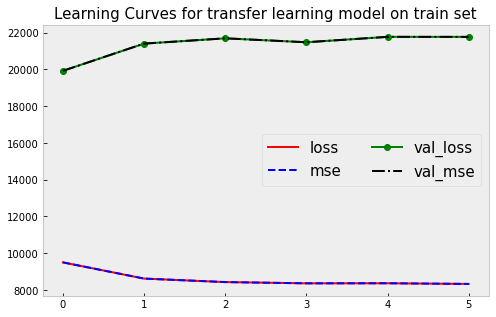

In [35]:
key_names = list(history_h_2.history.keys())
colors = ['-r','--b','-og','-.k']

plt.figure(figsize=(8,5))
for i in range(len(key_names)):
    plt.plot(history_h_2.history[key_names[i]], colors[i], label=key_names[i])
plt.legend(fontsize=15,ncol=2)
plt.title('Learning Curves for transfer learning model on train set', size=15);
plt.savefig('lc_transfer_prob_3.png',dpi=900)

In [32]:
h_model.save('model_h_3')


2022-12-10 18:08:50.630403: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: model_h_3/assets


### Test Function

For the test notebook, you will report performance in the test set for both dataset 1 and dataset 2.

* For dataset 1 (flower species dataset), report quantitative metrics.

* For dataset 2 (object detection), include qualitative measures with bounding box visualizations as well as your quantitative approach of choice (required for eel5934 only).

Your test Notebook should include:

1. Loading trained models from problems 1 and 3.

    * If the models are too big (which is to be expect especially if you are using transfer learning), upload the models' weights to a cloud service. Share the link in your readme.md file.
    
2. Make predictions to the respective test sets.

3. Include any necessary visualizations to include in the report.

---

# Submit Your Solution

Confirm that you've successfully completed the assignment.

Along with the Notebook, include a PDF of the notebook with your solutions.

```add``` and ```commit``` the final version of your work, and ```push``` your code to your GitHub repository.

Submit the URL of your GitHub Repository as your assignment submission on Canvas.

---